# 1. Tải dữ liệu từ github về drive (Opt.)

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!git clone https://github.com/nguyenhuuphuc11052005/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem.git

Cloning into 'Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem'...
remote: Enumerating objects: 566, done.
remote: Counting objects: 100% (120/120), done.
remote: Compressing objects: 100% (100/100), done.
remote: Total 566 (delta 56), reused 59 (delta 20), pack-reused 446 (from 1)
Receiving objects: 100% (566/566), 23.63 MiB | 19.44 MiB/s, done.
Resolving deltas: 100% (320/320), done.


# 2. Chuyển nhánh (Opt.)

In [ ]:
# check branch
!git branch -a

  main
* qzang_testing
  remotes/origin/HEAD -> origin/main
  remotes/origin/Nanh
  remotes/origin/feature/vit-encoder
  remotes/origin/main
  remotes/origin/master
  remotes/origin/qzang_testing


In [ ]:
# chuyển branch
!git checkout qzang_testing

D	vocab_ver2.pkl
Already on 'qzang_testing'
Your branch is up to date with 'origin/qzang_testing'.


# 3. Truy cập vào folder

In [3]:
%cd /content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/

/content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem


In [4]:
!git pull

remote: Enumerating objects: 8, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 6 (delta 4), reused 0 (delta 0), pack-reused 0 (from 0)
Unpacking objects: 100% (6/6), 1.82 KiB | 1024 bytes/s, done.
From https://github.com/nguyenhuuphuc11052005/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem
   30c4761..d2554fb  qzang_testing -> origin/qzang_testing
Updating 30c4761..d2554fb
Fast-forward
 eval.py | 4 ++--
 1 file changed, 2 insertions(+), 2 deletions(-)


# 4. Tải thư viện cần thiết

In [5]:
# tải thư viện cần thiết
!pip install -r requirement.txt

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 8.7 MB/s eta 0:00:00
  Created wheel for rouge_score: filename=rouge_score-0.1.2-py3-none-any.whl size=24934 sha256=f65e181caaca09cd0306be9728adb60725b2ae2a1b598670eb2aec1da3ebf4ff
  Stored in directory: /root/.cache/pip/wheels/85/9d/af/01feefbe7d55ef5468796f0c68225b6788e85d9d0a281e7a70
Successfully built rouge_score


# 5. Tải dữ liệu ảnh từ kaggle (Opt.)
đường dẫn đến file ảnh: /root/.cache/kagglehub/datasets/jeffaudi/coco-2014-dataset-for-yolov3/4

In [6]:
# tải file ảnh
import kagglehub
path = kagglehub.dataset_download("jeffaudi/coco-2014-dataset-for-yolov3")

100%|██████████| 25.0G/25.0G [24:24<00:00, 18.3MB/s]

Extracting files...


# 6. Chia file train caption thành train, val và test


In [ ]:
# # up file captions lên đây
# from google.colab import files
# uploaded = files.upload()

In [ ]:
# import json
# import random
# import os

# def create_coco_splits(original_json_path, output_dir, total_images=50000, train_ratio=0.8, val_ratio=0.1):
#     print("Đang nạp file JSON gốc. Vui lòng đợi (có thể mất khoảng 1-2 phút)...")
#     with open(original_json_path, 'r') as f:
#         coco_data = json.load(f)

#     print("Đang xử lý dữ liệu...")
#     # 1. Lấy danh sách tất cả các ảnh và xáo trộn ngẫu nhiên
#     images = coco_data['images']
#     random.seed(42) # Cố định seed để nếu chạy lại vẫn ra đúng tập này
#     random.shuffle(images)

#     # 2. Cắt lấy đúng số lượng ảnh mong muốn (50.000)
#     subset_images = images[:total_images]

#     # 3. Tính toán số lượng cho từng tập
#     train_size = int(total_images * train_ratio)
#     val_size = int(total_images * val_ratio)

#     train_images = subset_images[:train_size]
#     val_images = subset_images[train_size:train_size + val_size]
#     test_images = subset_images[train_size + val_size:]

#     print(f"Đã chia: Train ({len(train_images)}), Val ({len(val_images)}), Test ({len(test_images)})")

#     # 4. Tạo dictionary map image_id với thông tin ảnh để tra cứu nhanh
#     def get_annotations_for_images(image_list):
#         img_ids = {img['id'] for img in image_list}
#         # Lọc ra các caption thuộc về những ảnh trong danh sách
#         anns = [ann for ann in coco_data['annotations'] if ann['image_id'] in img_ids]
#         return anns

#     # 5. Hàm lưu file JSON mới giữ nguyên cấu trúc COCO
#     def save_split(img_list, filename):
#         anns = get_annotations_for_images(img_list)
#         split_data = {
#             "info": coco_data.get("info", {}),
#             "licenses": coco_data.get("licenses", []),
#             "images": img_list,
#             "annotations": anns
#         }

#         out_path = os.path.join(output_dir, filename)
#         with open(out_path, 'w') as f:
#             json.dump(split_data, f)
#         print(f"Đã lưu thành công: {out_path} (Gồm {len(img_list)} ảnh và {len(anns)} captions)")

#     # 6. Tạo thư mục đầu ra và lưu các file
#     os.makedirs(output_dir, exist_ok=True)
#     save_split(train_images, "subset_train.json")
#     save_split(val_images, "subset_val.json")
#     save_split(test_images, "subset_test.json")

# # HƯỚNG DẪN CHẠY:
# # Sửa đường dẫn bên dưới cho khớp với vị trí bạn lưu file
# original_path = "captions_train2014.json"# file caption tự upload lên Colab
# output_folder = "/content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/data/ms_coco/annotations/"

# create_coco_splits(original_path, output_folder)

In [ ]:
!git pull

remote: Enumerating objects: 5, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (1/1), done.
remote: Total 3 (delta 2), reused 3 (delta 2), pack-reused 0 (from 0)
Unpacking objects: 100% (3/3), 902 bytes | 1024 bytes/s, done.
From https://github.com/nguyenhuuphuc11052005/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem
   5f475ac..30c4761  qzang_testing -> origin/qzang_testing
Updating 5f475ac..30c4761
Fast-forward
 inference.py | 47 ++++++++++++++++++++++++++++++++++++++++++++++-
 1 file changed, 46 insertions(+), 1 deletion(-)


# 7. Đánh giá chỉ số của mô hình

In [7]:
import os
import json
import torch
import torch.nn as nn
import argparse
import torchvision.transforms as transforms
# import torch.distributed as dist
import warnings
warnings.filterwarnings("ignore")
import pickle
# from src.data.vocabulary import Vocabulary
from src.data.dataset import get_loader, get_transforms
from src.models.encoder import ResNet50Encoder,ResNet50SpatialEncoder
from src.models.decoder_lstm import LSTMDecoder
from src.models.m2_transformer import M2TransformerDecoder
from src.models.vit_transformer import ViTCaptioningModel
from src.training.train import train_model
from src.utils import set_seed, load_config


## Đánh giá 3 mô hình bằng beam search với beam_size=5

In [ ]:
!python eval.py \
  --config configs/baseline_lstm.yaml \
  --checkpoint experiments/checkpoints/baseline_lstm_run1/best_model.pth \
  --model_type lstm \
  --decode_mode beam_search \
  --beam_size 5 \
  --images_path /root/.cache/kagglehub/datasets/jeffaudi/coco-2014-dataset-for-yolov3/versions/4/coco2014/images/train2014 \
  --ann_file /content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/data/ms_coco/annotations/subset_test.json

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
2026-05-27 18:13:10,835 - INFO - Start evaluation
2026-05-27 18:13:10,837 - INFO - Model type: lstm
2026-05-27 18:13:10,839 - INFO - Decode mode: beam_search
2026-05-27 18:13:10,840 - INFO - Beam size: 5
2026-05-27 18:13:10,840 - INFO - Checkpoint: experiments/checkpoints/baseline_lstm_run1/best_model.pth
2026-05-27 18:13:10,841 - INFO - Images path: /root/.cache/kagglehub/datasets/jeffaudi/coco-2014-dataset-for-yolov3/versions/4/coco2014/images/train2014
2026-05-27 18:13:10,841 - INFO - Annotation file: /content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/data/ms_coco/annotations/subset_test.json
[*] Đã cố định Random Seed: 42
-> Đã load Vocab với 8853 từ.
[*] Đã nạp cấu hình từ configs/baseline_lstm.ya

In [ ]:
!python eval.py \
  --config configs/m2_transformer.yaml \
  --checkpoint experiments/checkpoints/m2_transformer_run1/best_model.pth \
  --model_type m2_transformer \
  --decode_mode beam_search \
  --beam_size 5 \
  --images_path /root/.cache/kagglehub/datasets/jeffaudi/coco-2014-dataset-for-yolov3/versions/4/coco2014/images/train2014 \
  --ann_file /content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/data/ms_coco/annotations/subset_test.json

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
2026-05-27 18:30:28,403 - INFO - Start evaluation
2026-05-27 18:30:28,405 - INFO - Model type: m2_transformer
2026-05-27 18:30:28,405 - INFO - Decode mode: beam_search
2026-05-27 18:30:28,406 - INFO - Beam size: 5
2026-05-27 18:30:28,407 - INFO - Checkpoint: experiments/checkpoints/m2_transformer_run1/best_model.pth
2026-05-27 18:30:28,407 - INFO - Images path: /root/.cache/kagglehub/datasets/jeffaudi/coco-2014-dataset-for-yolov3/versions/4/coco2014/images/train2014
2026-05-27 18:30:28,408 - INFO - Annotation file: /content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/data/ms_coco/annotations/subset_test.json
[*] Đã cố định Random Seed: 42
-> Đã load Vocab với 8853 từ.
[*] Đã nạp cấu hình từ configs/m2_tr

In [ ]:
!python eval.py \
  --config configs/vit_transformer.yaml \
  --checkpoint experiments/checkpoints/vit_transformer_v1/best_model.pth \
  --model_type vit_transformer \
  --decode_mode beam_search \
  --beam_size 5 \
  --images_path /root/.cache/kagglehub/datasets/jeffaudi/coco-2014-dataset-for-yolov3/versions/4/coco2014/images/train2014 \
  --ann_file /content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/data/ms_coco/annotations/subset_test.json

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
2026-05-27 19:10:56,219 - INFO - Start evaluation
2026-05-27 19:10:56,219 - INFO - Model type: vit_transformer
2026-05-27 19:10:56,219 - INFO - Decode mode: beam_search
2026-05-27 19:10:56,220 - INFO - Beam size: 5
2026-05-27 19:10:56,220 - INFO - Checkpoint: experiments/checkpoints/vit_transformer_v1/best_model.pth
2026-05-27 19:10:56,220 - INFO - Images path: /root/.cache/kagglehub/datasets/jeffaudi/coco-2014-dataset-for-yolov3/versions/4/coco2014/images/train2014
2026-05-27 19:10:56,220 - INFO - Annotation file: /content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/data/ms_coco/annotations/subset_test.json
[*] Đã cố định Random Seed: 42
-> Đã load Vocab với 8853 từ.
[*] Đã nạp cấu hình từ configs/vit_t

## Trực quan kết quả

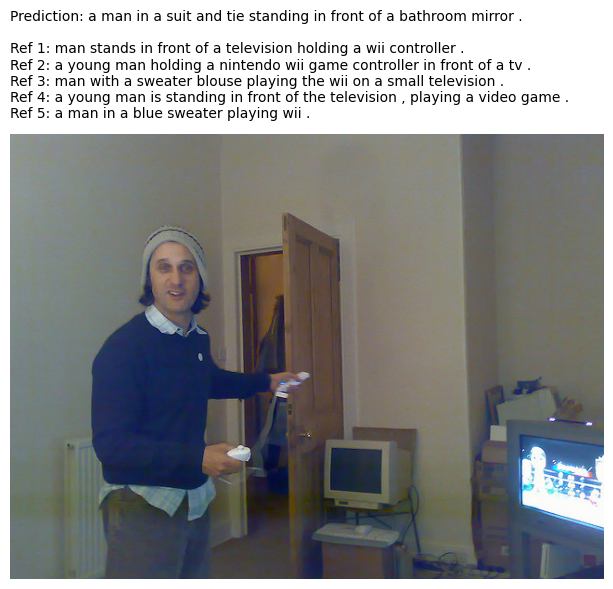

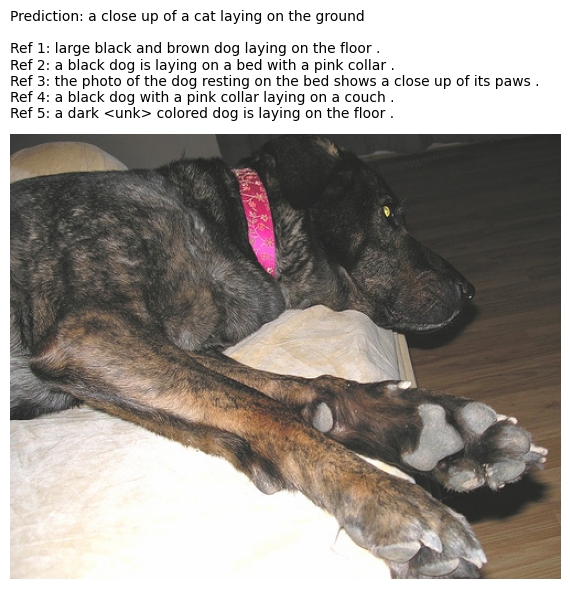

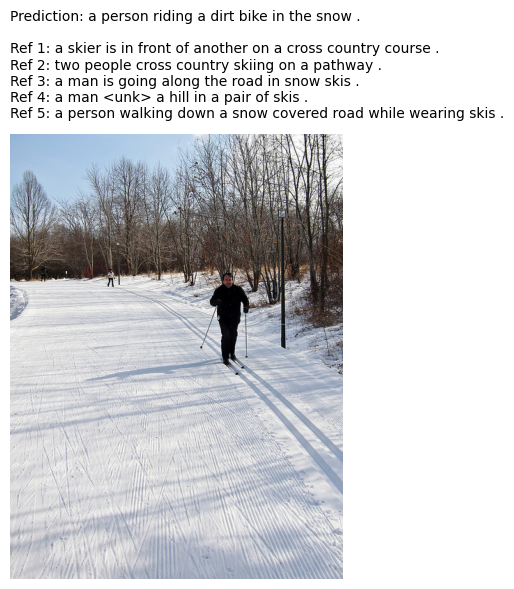

In [ ]:
import json
import torch
from inference import plot_caption_from_log

with open("experiments/logs/eval_lstm_beam_search_5/eval_predictions_ver1.json", "r", encoding="utf-8") as f:
    logs = json.load(f)
for i in range(3):
  plot_caption_from_log(logs[i])

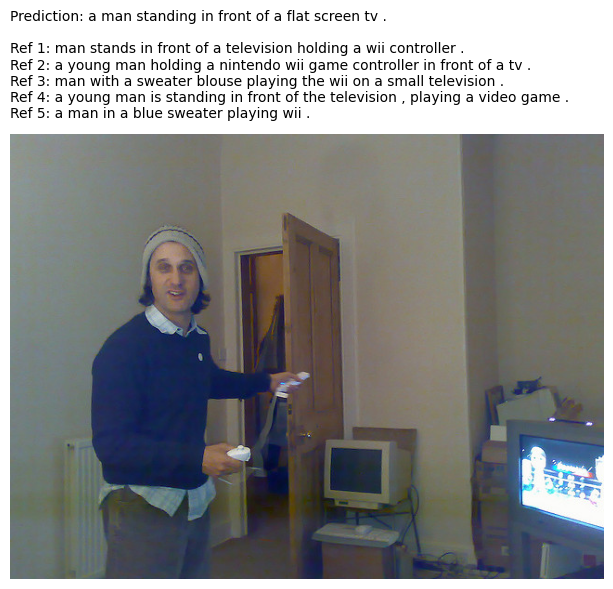

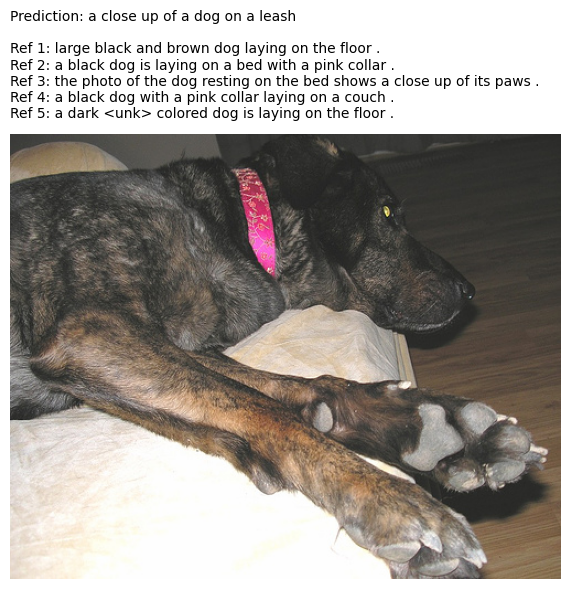

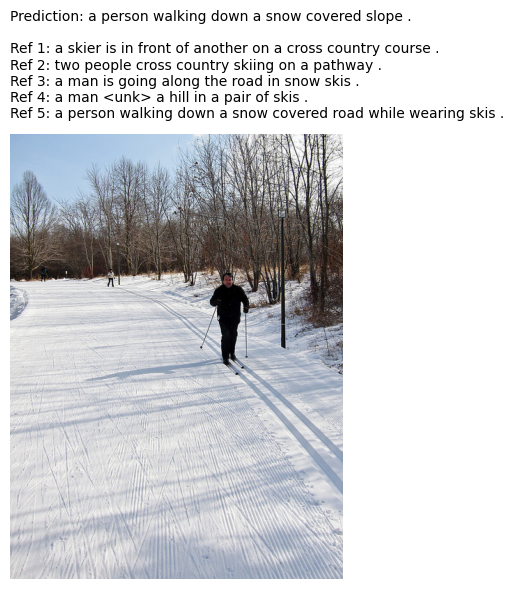

In [ ]:
with open("experiments/logs/eval_m2_transformer_beam_search_5/eval_predictions_ver1.json", "r", encoding="utf-8") as f:
    logs = json.load(f)
for i in range(3):
  plot_caption_from_log(logs[i])

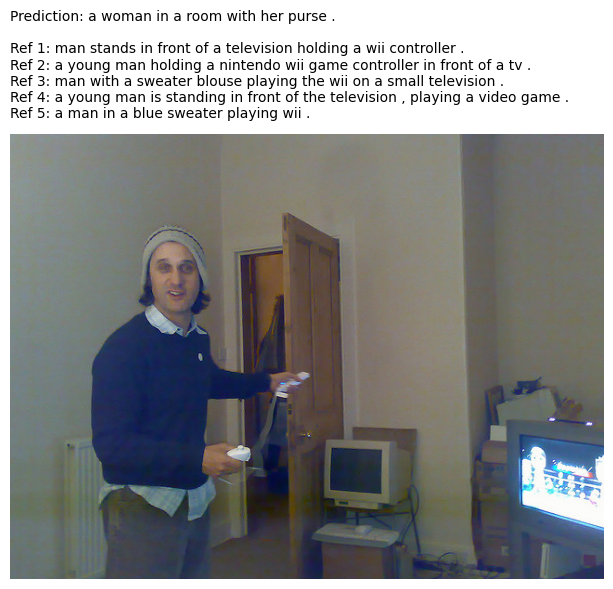

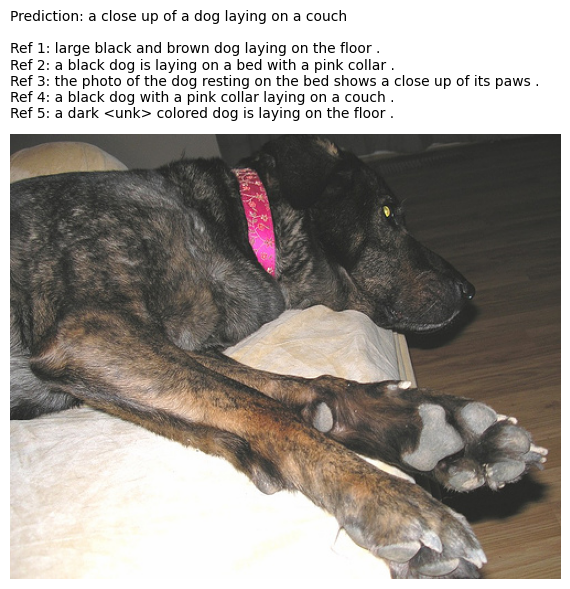

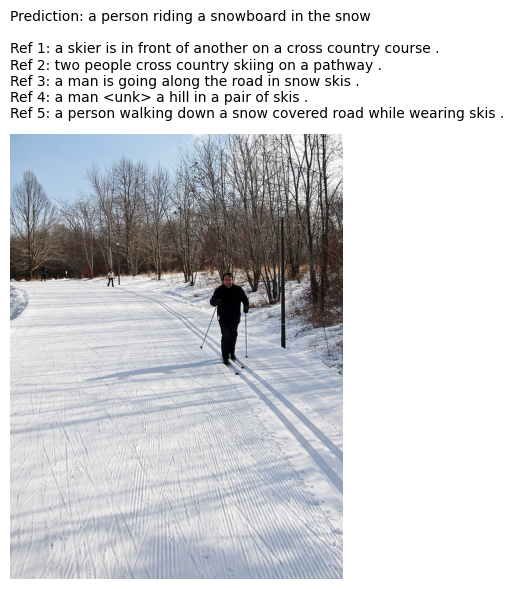

In [ ]:
with open("experiments/logs/eval_vit_transformer_beam_search_5/eval_predictions_ver1.json", "r", encoding="utf-8") as f:
    logs = json.load(f)
for i in range(3):
  plot_caption_from_log(logs[i])

## Đánh giá 3 mô hình bằng greedy search

In [8]:
!python eval.py \
  --config configs/baseline_lstm.yaml \
  --checkpoint experiments/checkpoints/baseline_lstm_run1/best_model.pth \
  --model_type lstm \
  --decode_mode greedy \
  --images_path /root/.cache/kagglehub/datasets/jeffaudi/coco-2014-dataset-for-yolov3/versions/4/coco2014/images/train2014 \
  --ann_file /content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/data/ms_coco/annotations/subset_test.json

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
2026-05-28 21:04:19,312 - INFO - Start evaluation
2026-05-28 21:04:19,314 - INFO - Model type: lstm
2026-05-28 21:04:19,316 - INFO - Decode mode: greedy
2026-05-28 21:04:19,318 - INFO - Beam size: 5
2026-05-28 21:04:19,319 - INFO - Checkpoint: experiments/checkpoints/baseline_lstm_run1/best_model.pth
2026-05-28 21:04:19,319 - INFO - Images path: /root/.cache/kagglehub/datasets/jeffaudi/coco-2014-dataset-for-yolov3/versions/4/coco2014/images/train2014
2026-05-28 21:04:19,319 - INFO - Annotation file: /content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/data/ms_coco/annotations/subset_test.json
[*] Đã cố định Random Seed: 42
-> Đã load Vocab với 8853 từ.
[*] Đã nạp cấu hình từ configs/baseline_lstm.yaml
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoin

In [9]:
!python eval.py \
  --config configs/m2_transformer.yaml \
  --checkpoint experiments/checkpoints/m2_transformer_run1/best_model.pth \
  --model_type m2_transformer \
  --decode_mode greedy \
  --images_path /root/.cache/kagglehub/datasets/jeffaudi/coco-2014-dataset-for-yolov3/versions/4/coco2014/images/train2014 \
  --ann_file /content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/data/ms_coco/annotations/subset_test.json

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
2026-05-28 21:07:48,366 - INFO - Start evaluation
2026-05-28 21:07:48,368 - INFO - Model type: m2_transformer
2026-05-28 21:07:48,369 - INFO - Decode mode: greedy
2026-05-28 21:07:48,380 - INFO - Beam size: 5
2026-05-28 21:07:48,382 - INFO - Checkpoint: experiments/checkpoints/m2_transformer_run1/best_model.pth
2026-05-28 21:07:48,382 - INFO - Images path: /root/.cache/kagglehub/datasets/jeffaudi/coco-2014-dataset-for-yolov3/versions/4/coco2014/images/train2014
2026-05-28 21:07:48,382 - INFO - Annotation file: /content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/data/ms_coco/annotations/subset_test.json
[*] Đã cố định Random Seed: 42
-> Đã load Vocab với 8853 từ.
[*] Đã nạp cấu hình từ configs/m2_transfo

In [10]:
!python eval.py \
  --config configs/vit_transformer.yaml \
  --checkpoint experiments/checkpoints/vit_transformer_v1/best_model.pth \
  --model_type vit_transformer \
  --decode_mode greedy \
  --images_path /root/.cache/kagglehub/datasets/jeffaudi/coco-2014-dataset-for-yolov3/versions/4/coco2014/images/train2014 \
  --ann_file /content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/data/ms_coco/annotations/subset_test.json

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
2026-05-28 21:18:09,999 - INFO - Start evaluation
2026-05-28 21:18:10,000 - INFO - Model type: vit_transformer
2026-05-28 21:18:10,001 - INFO - Decode mode: greedy
2026-05-28 21:18:10,001 - INFO - Beam size: 5
2026-05-28 21:18:10,002 - INFO - Checkpoint: experiments/checkpoints/vit_transformer_v1/best_model.pth
2026-05-28 21:18:10,003 - INFO - Images path: /root/.cache/kagglehub/datasets/jeffaudi/coco-2014-dataset-for-yolov3/versions/4/coco2014/images/train2014
2026-05-28 21:18:10,003 - INFO - Annotation file: /content/drive/MyDrive/Evaluating-the-evolution-of-Deep-Learning-architecture-in-the-Image-Captioning-problem/data/ms_coco/annotations/subset_test.json
[*] Đã cố định Random Seed: 42
-> Đã load Vocab với 8853 từ.
[*] Đã nạp cấu hình từ configs/vit_transf

## Trực quan kết quả

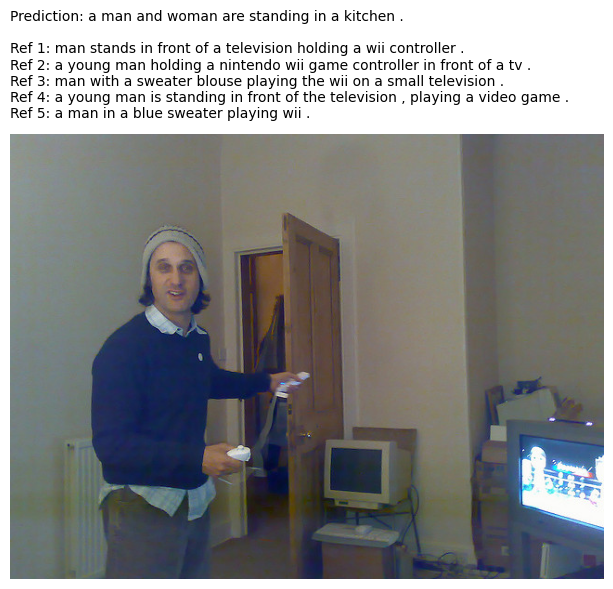

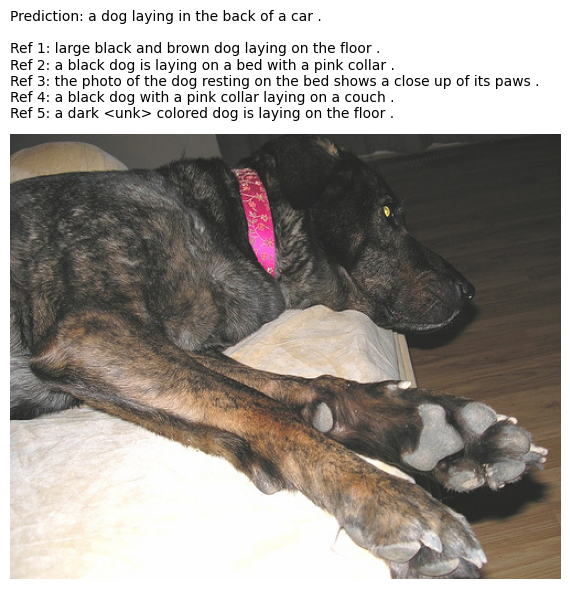

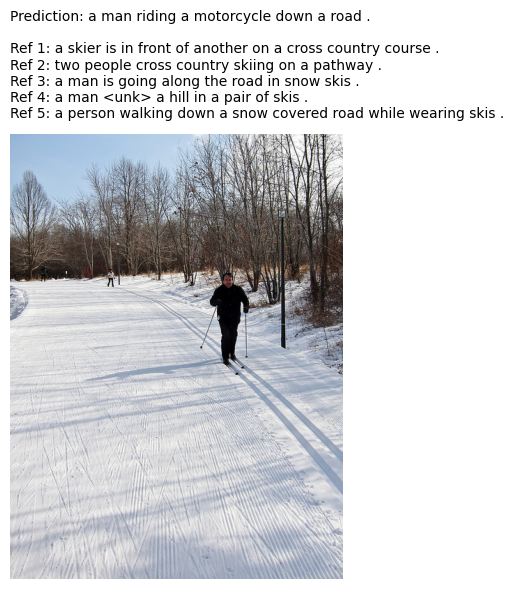

In [11]:
import json
import torch
from inference import plot_caption_from_log

with open("experiments/logs/eval_lstm_greedy_5/eval_predictions_ver1.json", "r", encoding="utf-8") as f:
    logs = json.load(f)
for i in range(3):
  plot_caption_from_log(logs[i])

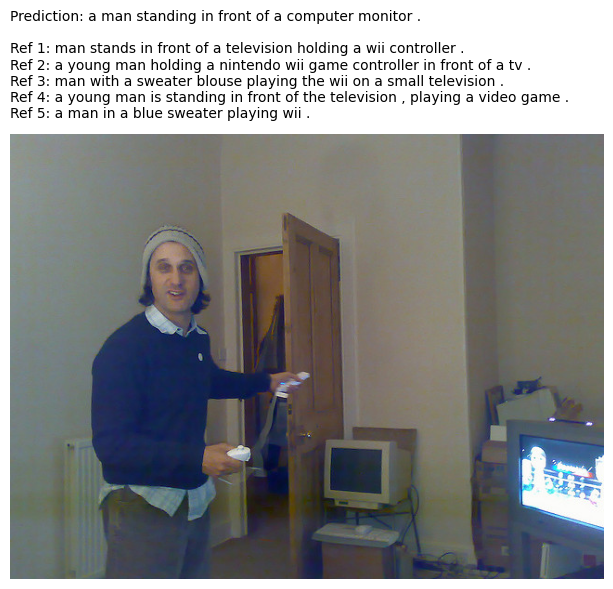

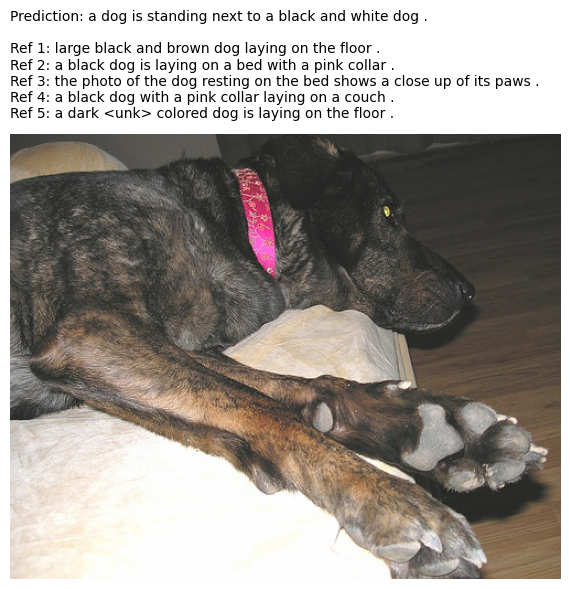

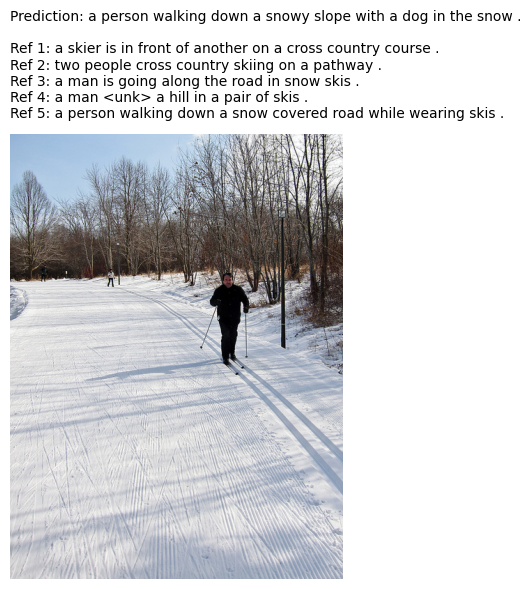

In [12]:
with open("experiments/logs/eval_m2_transformer_greedy_5/eval_predictions_ver1.json", "r", encoding="utf-8") as f:
    logs = json.load(f)
for i in range(3):
  plot_caption_from_log(logs[i])

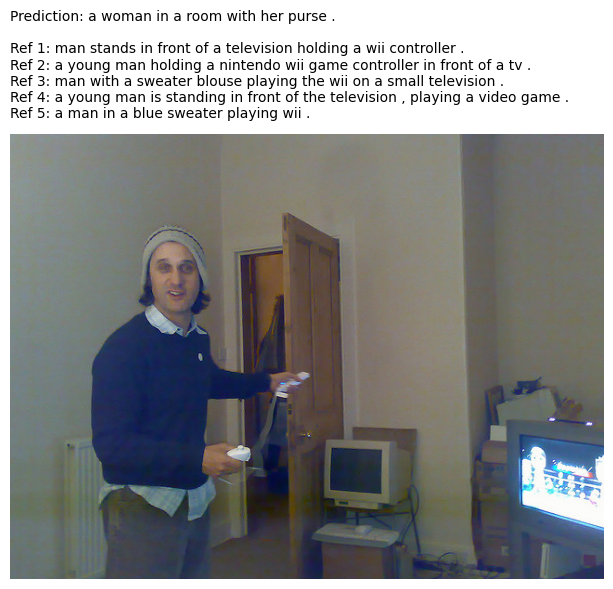

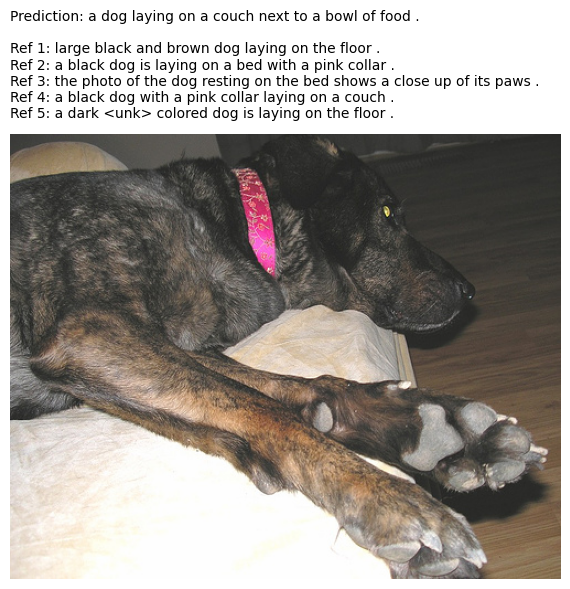

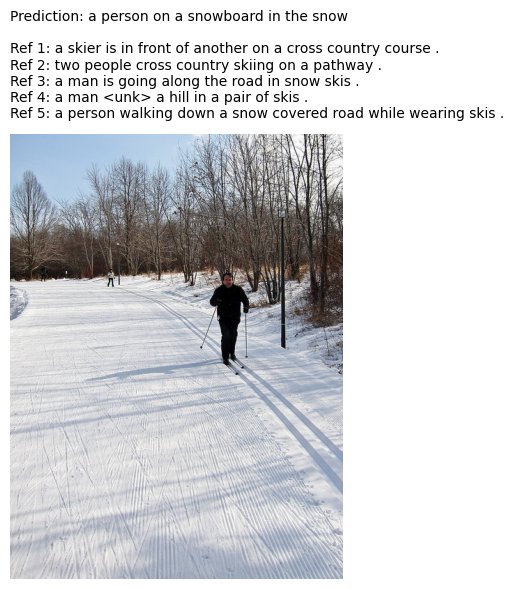

In [14]:
with open("experiments/logs/eval_vit_transformer_greedy_5/eval_predictions_ver1.json", "r", encoding="utf-8") as f:
    logs = json.load(f)
for i in range(3):
  plot_caption_from_log(logs[i])

# 8. Đánh giá mức độ hội tụ của mô hình

## Đọc file logs của train

In [15]:
import re
import matplotlib.pyplot as plt

def plot_history_train_log(log_path):
  '''
  Vẽ đồ thị loss của train và val
  '''
  epochs = []
  train_losses = []
  val_losses = []

  pattern = r"Epoch \[(\d+)\] - Train Loss: ([\d.]+) \| Val Loss: ([\d.]+)"

  with open(log_path, "r", encoding="utf-8") as f:
    for line in f:
      match = re.search(pattern, line)
      if match:
        epochs.append(int(match.group(1)))
        train_losses.append(float(match.group(2)))
        val_losses.append(float(match.group(3)))

  plt.figure(figsize=(8, 5))
  plt.plot(epochs, train_losses, marker="o", label="Train Loss")
  plt.plot(epochs, val_losses, marker="o", label="Validation Loss")

  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.title("Train Loss vs Validation Loss")
  plt.legend()
  plt.grid(True)
  plt.show()

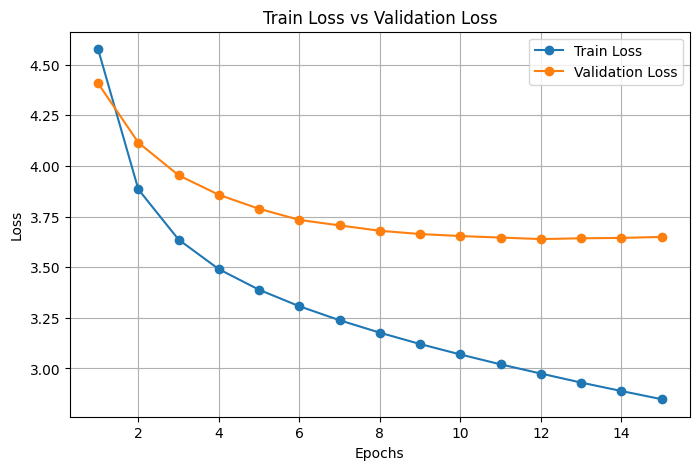

In [17]:
# đồ thị của mô hình lstm
lstm_log_path = "experiments/logs/baseline_lstm_run1/train_20260518_032148.log"
plot_history_train_log(lstm_log_path)

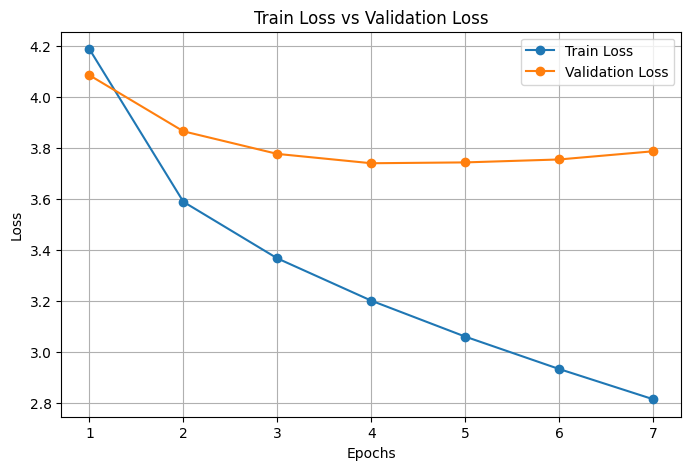

In [18]:
# đồ thị của mô hình m2_transformer
m2_transformer_log_path = "experiments/logs/m2_transformer_run1/train_20260518_141446.log"
plot_history_train_log(m2_transformer_log_path)

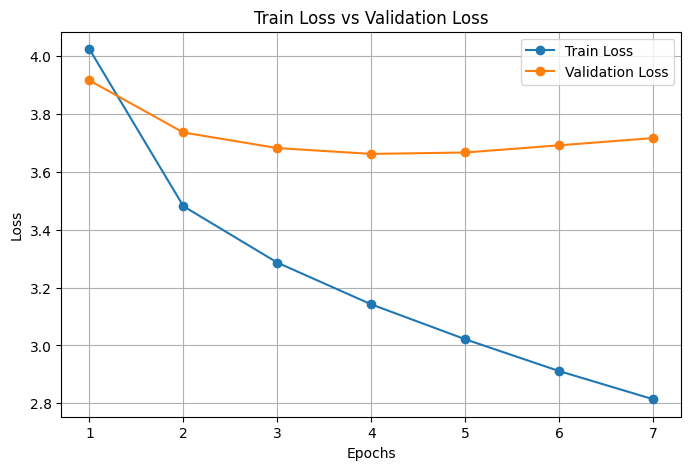

In [20]:
# đồ thị của mô hình vit_transformer
vit_transformer_log_path = "experiments/logs/vit_transformer_v1/train_20260518_084511.log"
plot_history_train_log(vit_transformer_log_path)